In [1]:
# @Author: Gebremichael
# @File: dialogic_ADPCM.py 
import wave
import numpy as np

# table of index
IndexTable = [-1, -1, -1, -1, 2, 4, 6, 8, -1, -1, -1, -1, 2, 4, 6, 8]

# table of  quantizer step size
StepSizeTable = [7, 8, 9, 10, 11, 12, 13, 14, 16, 17, 19, 21, 23, 25, 28, 31, 34, 37, 41, 45, 50, 55, 60, 66, 73, 80, 88, 97, 107, 118, 130, 143, 157, 173, 190, 209, 230, 253, 279, 307, 337, 371, 408, 449, 494, 544, 598, 658, 724, 796, 876, 963, 1060, 1166, 1282, 1411, 1552, 1707, 1878, 2066, 2272, 2499, 2749, 3024, 3327, 3660, 4026, 4428, 4871, 5358, 5894, 6484, 7132, 7845, 8630, 9493, 10442, 11487, 12635, 13899, 15289, 16818, 18500, 20350, 22385, 24623, 27086, 29794, 32767]

# ADPCM_Encode.
# sample: a 16-bit PCM sample
# retval : a 4-bit ADPCM sample
predsample = 0
index = 0

# # ======================================================================================
# Encoding from PCM to ADPCM (16-bit PCM sample to 4-bit ADPCM  sample word length)
def ADPCM_Encode(sample):
    global index
    global predsample
    global diffq
    global ore_diff
    global error_signal
    
    code = 0
    
    step_size = StepSizeTable[index]

    # compute diff and record sign and absolut value
          
    diff = sample - predsample
    ore_diff=diff
    #print('diff sample:' ,ore_diff)
    if diff < 0:
        code = 8
        diff = -diff

    # quantize the diff into ADPCM code
    # inverse quantize the code into a predicted diff
    tmpstep = step_size
    diffq = step_size >> 3
    if diff >= tmpstep:
        code = code | 0x04
        diff -= tmpstep
        diffq = diffq + step_size

    tmpstep = tmpstep >> 1
    if diff >= tmpstep:
        code = code | 0x02
        diff = diff - tmpstep
        diffq = diffq + (step_size >> 1)

    tmpstep = tmpstep >> 1
    if diff >= tmpstep:
        code = code | 0x01
        diffq = diffq + (step_size >> 2)
    
    # fixed predictor to get new predicted sample
    if code & 8:
        predsample = predsample - diffq
    else:
        predsample = predsample + diffq
         
    # check for overflow
    if predsample > 32767:
        predsample = 32767
    elif predsample < -32768:
        predsample = -32768

    # find new stepsize index
    index += IndexTable[code]

    # check for overflow
    if index < 0:
        index = 0

    if index > 88:
        index = 88
    error_signal = sample - predsample
    
    # return new ADPCM code code & 0x0f == code
    return code & 0x0f


# ADPCM_Decode.
# code: a byte containing a 4-bit ADPCM sample.
# retval: 16-bit ADPCM sample
de_index = 0
de_predsample = 0

# ======================================================================================
# Decoding from ADPCM to PCM  ( a 4-bit ADPCM sample to 16-bit PCM sample word length)
def ADPCM_Decode(code):
    global de_index
    global de_predsample

    step_size = StepSizeTable[de_index]

    # inverse code into diff    
    diffq = step_size >> 3  # == step/8
    if code & 4:
        diffq += step_size

    if code & 2:
        diffq += step_size >> 1

    if code & 1:
        diffq += step_size >> 2

       
    # add diff to predicted sample
    if code & 8:
        diffq = -diffq

    de_predsample += diffq

    # check for overflow  clip the values to +/- 2^11 (supposed to be 16 bits)
    if de_predsample > 32767:
        de_predsample = 32767
    elif de_predsample < -32768:
        de_predsample = -32768

    # find new quantizer step size
    de_index += IndexTable[code]

    # check for overflow
    if de_index < 0:
        de_index = 0

    if de_index > 88:
        de_index = 88

    # save predict sample and de_index for next iteration
    # return new decoded sample
    # The original algorithm turned out to be 12bit, need to convert to 16bit
    return de_predsample

In [2]:
import matplotlib.pyplot as plt
#%pmatplotlib inline
import IPython.display as ipd
import librosa
import librosa.display
import numpy as np
# Plotting package
import matplotlib.pyplot as plt

# ===============Different Data loading==============

# .................scipy wave based data..............
import wave
from scipy.io import wavfile
np.set_printoptions(threshold=np.inf)
audio_file = 'dataset/Test_dataset_all_8_speaker_merged_MS_and_FS.wav'
fs, data = wavfile.read(audio_file)
wavdata=data[::]

# .................librosa based data..............
#audio, fs = librosa.load(audio_file, sr = 8000)
#wavdata=audio[:]

org_samp=[]
pre_samp=[]
oreginal_diff=[]
adpcm_code = []
q_diff=[]
err_signal=[]

for i in range(len(wavdata)):
    ADPCM_sample = ADPCM_Encode(wavdata[i])   
    pred_sample = ADPCM_Decode(ADPCM_sample)
    #print("Sample:", wavdata[i])
    #print("ADPCM code:", ADPCM_sample)
    #print('................................')
    
    org_samp.append(wavdata[i])
    pre_samp.append(pred_sample)
    oreginal_diff.append(ore_diff)
    q_diff.append(diffq)
    err_signal.append(error_signal)
    
org_samp=np.array(org_samp)           #oreginal signal samples
pre_samp=np.array(pre_samp)           #predicted sample 

oreginal_diff=np.array(oreginal_diff) #the oreginal and predicted sample difference
adpcm_code = np.array(adpcm_code)     #the ADPCM code the is transmited to decoder 
q_diff = np.array(q_diff)             #the quantized difference/inverse of quantization difference
e_signal=np.array(err_signal)         #the error of the prediction (residual signal)

In [3]:
# Normalize Data Between 0 and 1
y = org_samp
ypn = pre_samp

org_samp = np.array(y)
# goal : range [0, 1]
org_samp = (org_samp - min(org_samp)) / ( max(org_samp) - min(org_samp) )

pre_samp = np.array(ypn)
pre_samp = (pre_samp - min(pre_samp)) / ( max(pre_samp) - min(pre_samp) )

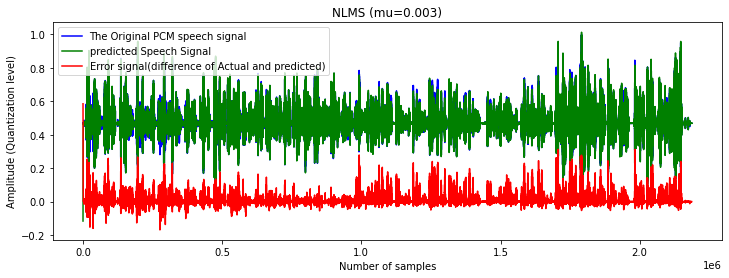

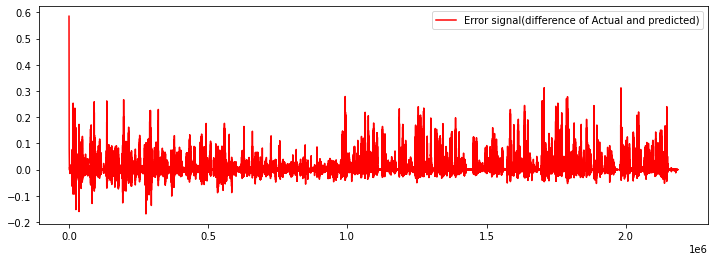

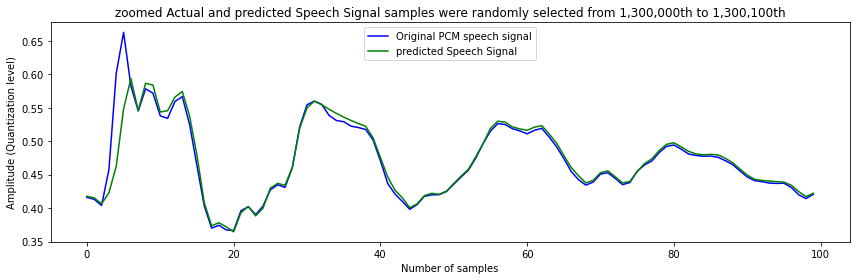

In [8]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

import padasip as pa
import matplotlib.pylab as plt
import seaborn as sns
import os

%matplotlib inline
SEED = 121
np.random.seed(SEED)


# ===============real speech data preparation ==============
n = 2
s = org_samp  # initial timeseries data
sp = pre_samp
x = pa.input_from_history(sp, n)  # input matrix
N = len(x)

d = np.zeros(len(x))
# define target
for i, k in enumerate(range((n-1), N)):
    d[i] = s[k]
    

# =============== Functions ==============    
def plot_filter_result(pred: np.ndarray, actual: np.ndarray, error: np.ndarray, n: int,
                       mu_val: str='0.5', section_visual_flag: bool=True):
       
    plt.figure(figsize=(12, 4))
    plt.title(f'NLMS (mu={mu_val})')
    plt.xlabel('Number of samples')
    plt.ylabel('Amplitude (Quantization level)')
    plt.plot(actual[: (len(actual)-n)], 'b', label='The Original PCM speech signal')
    plt.plot(pred[: (len(pred)-n)], 'g', label='predicted Speech Signal')
    plt.plot(error[: (len(pred)-n)], 'r', label='Error signal(difference of Actual and predicted)')
    plt.legend(loc='upper left')
    
    plt.figure(figsize=(12, 4))
    plt.plot(error[: (len(pred)-n)], 'r', label='Error signal(difference of Actual and predicted)')
    plt.legend(loc='upper right')
    
    
    plt.figure(figsize=(16, 4))
    #plt.ylim(0, 1)
    plt.title(f'NLMS (mu={mu_val})')
    plt.xlabel('Number of samples')
    #plt.ylabel('Amplitude (Quantization level)')
    plt.title('Online GRU predictor based ADPCM Codec') 
    plt.plot(actual[: (len(actual)-n)], 'b', label='The Original PCM speech signal')
    plt.plot(pred[: (len(pred)-n)], 'g', label='predicted Speech Signal')
    plt.plot(error[: (len(pred)-n)], 'r', label='Error signal(difference of Actual and predicted)')
    plt.legend(loc='upper right')
    plt.savefig("RNN_ADPCM_encoder.png", dpi=300)
    plt.close()
    
    plt.figure(figsize=(12, 4))
    
    plt.title('zoomed Actual and predicted Speech Signal samples' 
              ' were randomly selected from 1,300,000th to 1,300,100th')

    plt.xlabel('Number of samples')
    plt.ylabel('Amplitude (Quantization level)')
    plt.plot(actual[1300000:1300100], "b", label='Original PCM speech signal')
    plt.plot(pred[1300000:1300100], "g", label='predicted Speech Signal')
    plt.legend(loc='upper center')
#     plt.savefig("zoomed POGRU predictor with IMA-ADPCM 1,300,000th to 1,300,100th signal.png", dpi=300, bbox_inches='tight')
#     plt.close()       
    
    plt.tight_layout()
    plt.show()
    #return None
    return actual,pred


# =============== Functions call of Filter NLMS ==============
error_list = []
pa_list = []
for i, mu_ in enumerate([0.003]):
    f_nlms = pa.filters.FilterNLMS(n=n, mu=mu_, w='random')
    y, e, w = f_nlms.run(d, x)
    actual,pred=plot_filter_result(pred=y, actual=d, error=e, mu_val=mu_, n=n)    
    pa_list.append(f_nlms)


In [5]:
ipd.display(ipd.Audio(data=actual[:], rate=16000))

In [6]:
ipd.display(ipd.Audio(data=pred[:], rate=16000))

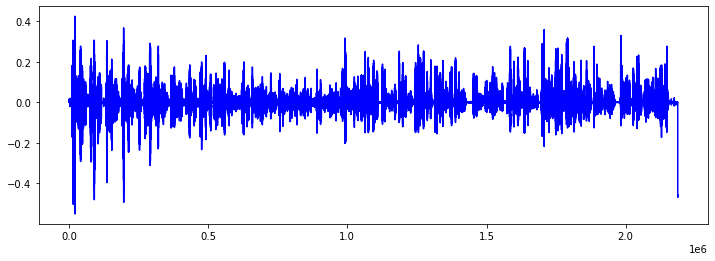

NLMS based ADPCM predictor SNR: 29.01877308989673 dB


In [7]:
# ============= Calculating Signal to Noise Ratio (SNR)===========
#error = org_samp[60000:80050] - pre_samp[60000:80050]
error = actual[:] - pred[:]

plt.figure(figsize=(12, 4))
plt.plot(error, 'b')
plt.show()

org_sigpow = 10*np.log10(np.mean(pow(np.abs(actual[:]),2)))
error_mse = 10*np.log10(np.mean(pow(np.abs(error),2)))

#print(dnn_mse, dnn_sigpow, lms_mse, lms_sigpow)
print("NLMS based ADPCM predictor SNR:", org_sigpow - error_mse, "dB")